# **Title:**
**Self-Supervised Learning for Object-Centric Image Representations using Flickr30k**

### Team: UBIT

- **Satwika Davala**  — `satwikad`  
- **. Mythri Sivakumar** — `mythrish`  
- **Abhinav Ravella** — `ravella`  



## **1: Setup & Import Dependencies**

In [ ]:
!apt-get install git-lfs -y
!git lfs install


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
git-lfs is already the newest version (3.0.2-1ubuntu0.3).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.
Git LFS initialized.


In [ ]:
!git clone https://github.com/ravellaabhinav/phase1-artifacts.git

Cloning into 'phase1-artifacts'...
remote: Enumerating objects: 5, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 5 (delta 0), reused 5 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (5/5), done.
Filtering content: 100% (2/2), 1.98 GiB | 37.97 MiB/s, done.


In [ ]:
!7z x /content/phase1-artifacts/phase1_artifacts_2.zip.001 -o/content/phase1_artifacts -y


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.00GHz (50653),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/phase1-artifacts/                                    1 file, 1992294400 bytes (1900 MiB)

Extracting archive: /content/phase1-artifacts/phase1_artifacts_2.zip.001
  0% 1 Open           --
Path = /content/phase1-artifacts/phase1_artifacts_2.zip.001
Type = Split
Physical Size = 1992294400
Volumes = 2
Total Physical Size = 2131280595
----
Path = phase1_artifacts_2.zip
Size = 2131280595
--
Path = phase1_artifacts_2.zip
Type = zip
Physical Size = 2131280595

  0%      1% - phase1_artifacts.zip                             2% - phase1_artifacts.zip                    

In [ ]:
!7z x /content/phase1_artifacts/phase1_artifacts.zip -o/content/phase_artifacts -y


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.00GHz (50653),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/phase1_artifacts/                                    1 file, 2183899138 bytes (2083 MiB)

Extracting archive: /content/phase1_artifacts/phase1_artifacts.zip
  1% 4096 Open               83% 229376 Open                --
Path = /content/phase1_artifacts/phase1_artifacts.zip
Type = zip
Physical Size = 2183899138
64-bit = +

  0%      0% 777 - content/flickr30k/object_crops/6376797975_obj3.jpg                                                               0% 1218 - content/flickr30k/obje

In [ ]:
import os
from pathlib import Path
import zipfile
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
!pip install patool pyunpack -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.3/86.3 kB 3.3 MB/s eta 0:00:00


In [ ]:
import os
from pyunpack import Archive
from pathlib import Path

def fast_unzip(zip_path, extract_to):
    if not os.path.exists(extract_to):
        os.makedirs(extract_to)
    Archive(zip_path).extractall(extract_to)

zip_path = '/content/phase1_artifacts/phase1_artifacts.zip'
# extract_dir = Path("/content/drive/MyDrive/Project/")
extract_dir = Path("/content/phas1_artifacts")
fast_unzip(zip_path, extract_dir)

**Define expected paths from extracted directory**

In [ ]:
CROP_DIR = extract_dir / "content" / "flickr30k" / "object_crops"
MODEL_PATH = extract_dir / "simclr_epoch5.pt"
EMBED_PATH = extract_dir / "embeddings.npy"
FNAME_PATH = extract_dir / "embedding_filenames.txt"
TRAIN_LOG_PATH = extract_dir / "simclr_training_log.json"
CAPTION_FILE = "/content/drive/MyDrive/Project/cleaned_captions.txt"

**Load object crop filenames**

In [ ]:
crop_files = list(CROP_DIR.glob("*.jpg"))
print(f"Total object crops found: {len(crop_files)}")
print("Sample filenames:", [f.name for f in crop_files[:5]])

Total object crops found: 275775
Sample filenames: ['4872638109_obj3.jpg', '4448063160_obj3.jpg', '4328435391_obj18.jpg', '4604980786_obj3.jpg', '46360594_obj4.jpg']


**Load cleaned caption file**

In [ ]:
captions_df = pd.read_csv('/content/cleaned_captions (2).txt', sep='\t')
print(f" Captions loaded: {captions_df.shape[0]} records")
captions_df.head()

 Captions loaded: 158915 records


,image,caption,caption_length
0,1000092795.jpg,Two young guys with shaggy hair look at their ...,17
1,1000092795.jpg,"Two young , White males are outside near many ...",11
2,1000092795.jpg,Two men in green shirts are standing in a yard .,11
3,1000092795.jpg,A man in a blue shirt standing in a garden .,11
4,1000092795.jpg,Two friends enjoy time spent together .,7


**Match image IDs between crops and caption dataset**

In [ ]:
caption_image_ids = set(captions_df["image"].apply(lambda x: x.strip()))
crop_image_ids = set([f.stem.split('_')[0] + ".jpg" for f in crop_files])

matched_ids = caption_image_ids.intersection(crop_image_ids)
print(f" Matched image IDs: {len(matched_ids)} / {len(caption_image_ids)}")

if len(matched_ids) > 0:
    print(" Crop-caption alignment is valid. Ready to proceed.")
else:
    print(" No matching image IDs found. Verify file naming.")

 Matched image IDs: 31780 / 31783
 Crop-caption alignment is valid. Ready to proceed.


## **2: Create PairedCropCaptionDataset for Dual Encoder Training**

**Paired Dataset Class for Object Crops and Captions**

In [ ]:
%%time

import pandas as pd
from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset
import torchvision.transforms as T
from tqdm.auto import tqdm
from collections import defaultdict

CPU times: user 5.74 s, sys: 600 ms, total: 6.34 s
Wall time: 9.78 s


In [ ]:
class PairedCropCaptionDataset(Dataset):
    def __init__(self, crop_dir, caption_file, transform=None, clip_filter=None):
        self.crop_dir = Path(crop_dir)
        self.transform = transform
        self.clip_filter = clip_filter

        # Load and group captions
        self.captions = self._load_captions(caption_file)
        self.pairs = self._create_pairs()

    def _load_captions(self, caption_file):
        print("Loading captions...")
        df = pd.read_csv(caption_file, sep='\t', dtype=str)
        caption_dict = df.groupby('image')['caption'].apply(list).to_dict()
        print(f"Loaded captions for {len(caption_dict)} unique images.")
        return caption_dict

    def _create_pairs(self):
        print("Creating image-caption pairs from object crops...")
        crop_files = list(self.crop_dir.glob("*.jpg"))
        pairs = []

        for crop_path in tqdm(crop_files):
            image_id = crop_path.name.split("_")[0] + ".jpg"
            captions = self.captions.get(image_id, [])

            if self.clip_filter:
                similarities = self.clip_filter(crop_path, captions)
                captions = [c for c, s in zip(captions, similarities) if s > 0.3]

            for caption in captions:
                pairs.append((str(crop_path), caption))

        print(f"Total pairs created: {len(pairs)}")
        return pairs

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        crop_path, caption = self.pairs[idx]
        image = Image.open(crop_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, caption

**Transforms (standard for ResNet-based encoders)**

In [ ]:
transform = T.Compose([
    T.Resize(256),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
])

In [ ]:
# Instantiate dataset
paired_dataset = PairedCropCaptionDataset(
    crop_dir=CROP_DIR,
    caption_file=CAPTION_FILE,
    transform=transform
)

Loading captions...
Loaded captions for 31783 unique images.
Creating image-caption pairs from object crops...


  0%|          | 0/275775 [00:00<?, ?it/s]

Total pairs created: 1378875


**Preview Transformed Image (for Model Input)**

Caption: Here is a young man sitting on the ground looking for inspiration for a new drawing that is about architecture .


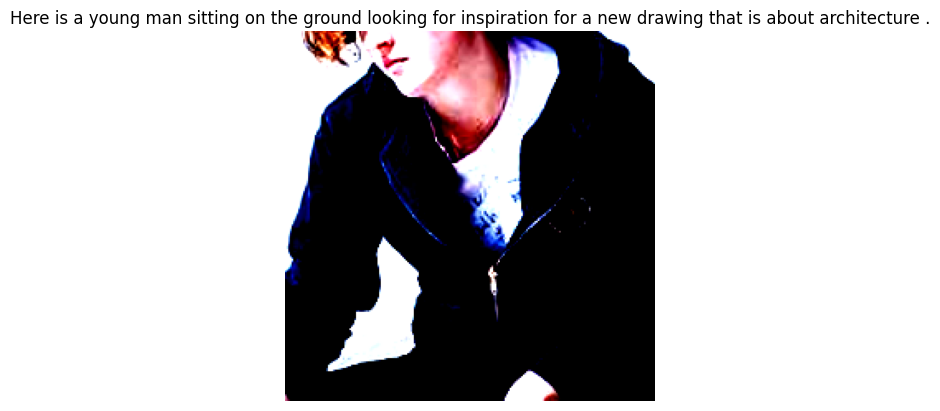

In [ ]:
# Preview one sample
img, caption = paired_dataset[1000]
print("Caption:", caption)

# Show the transformed image (Resized + Cropped)
plt.imshow(img.permute(1, 2, 0))
plt.axis('off')
plt.title(caption)
plt.show()

**Preview Original Uncropped Image (Full Object Region)**

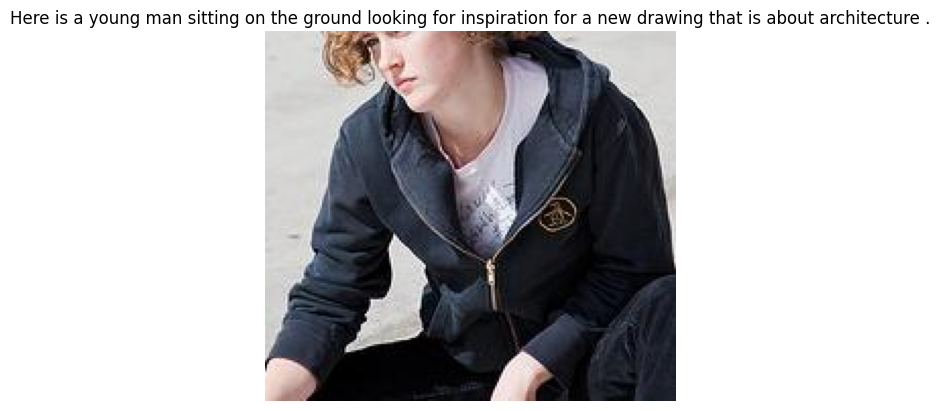

In [ ]:
# For previewing full uncropped image (without transform)
from PIL import Image

raw_img = Image.open(paired_dataset.pairs[1000][0])
plt.imshow(raw_img)
plt.axis('off')
plt.title(paired_dataset.pairs[1000][1])
plt.show()

## **3: Dual Encoder Model Definition (Visual + Text)**

**3.1 Visual Encoder + Load Weights**

In [ ]:
!pip install datasets
!pip install evaluate


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 2.7 MB/s eta 0:00:00


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from transformers import (
    BlipProcessor, BlipForConditionalGeneration,
    ViTImageProcessor, VisionEncoderDecoderModel, GPT2TokenizerFast
)
from evaluate import load

import random
import os

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models

# Visual Encoder (same ResNetSimCLR structure used in Phase 1)
class ResNetSimCLR(nn.Module):
    def __init__(self):
        super().__init__()
        self.backbone = models.resnet18(weights=None)
        num_ftrs = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()

        self.projector = nn.Sequential(
            nn.Linear(num_ftrs, 512),
            nn.ReLU(),
            nn.Linear(512, 128)
        )

    def forward(self, x):
        features = self.backbone(x)
        return self.projector(features)


visual_encoder = ResNetSimCLR()
state_dict = torch.load("/content/phase1_artifacts/simclr_epoch5.pt", map_location='cpu')
visual_encoder.load_state_dict(state_dict)
visual_encoder = visual_encoder.eval().to('cuda' if torch.cuda.is_available() else 'cpu')

<ipython-input-28-4cbbffcfa13d>:26: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load("/content/phas1_artifacts/simclr_epoch5.pt", map_location='cpu')


**3.2 Text Encoder (DistilBERT) + Tokenizer**

**3.3 Projection Head Definition**

In [ ]:
class ProjectionHead(nn.Module):
    def __init__(self, in_dim, out_dim=128):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, out_dim),
            nn.ReLU(),
            nn.LayerNorm(out_dim)
        )

    def forward(self, x):
        return self.net(x)

**3.4 Final DualEncoderModel**

In [ ]:
class DualEncoderModel(nn.Module):
    def __init__(self, visual_encoder, text_encoder, tokenizer, embed_dim=128):
        super().__init__()
        self.visual_encoder = visual_encoder
        self.text_encoder = text_encoder
        self.tokenizer = tokenizer

        # Only apply projection to text, visual is already 128-d
        self.text_proj = ProjectionHead(in_dim=768, out_dim=embed_dim)

        self.temperature = nn.Parameter(torch.tensor(0.07))

    def forward(self, images, captions):
        # Visual
        with torch.no_grad():
            vis_emb = self.visual_encoder(images)  # Already 128-d
        vis_emb = F.normalize(vis_emb, dim=-1)

        # Text
        tokenized = self.tokenizer(captions, return_tensors='pt', padding=True, truncation=True, max_length=40)
        tokenized = {k: v.to(images.device) for k, v in tokenized.items()}
        with torch.no_grad():
            txt_feats = self.text_encoder(**tokenized).last_hidden_state.mean(dim=1)
        txt_emb = F.normalize(self.text_proj(txt_feats), dim=-1)

        return vis_emb, txt_emb, self.temperature.exp()


**3.5 Sanity Test: 4 Image-Caption Pairs**

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
visual_encoder = visual_encoder.to(device)
text_encoder = text_encoder.to(device)

# Sample batch from dataset
image_batch = torch.stack([paired_dataset[i][0] for i in range(4)]).to(device)
caption_batch = [paired_dataset[i][1] for i in range(4)]

# Instantiate model
model = DualEncoderModel(visual_encoder, text_encoder, tokenizer).to(device)

# Forward pass
with torch.no_grad():
    vis_emb, txt_emb, temp = model(image_batch, caption_batch)

print(" Visual Embedding Shape:", vis_emb.shape)
print(" Text Embedding Shape:", txt_emb.shape)
print(" Temperature:", temp.item())

 Visual Embedding Shape: torch.Size([4, 128])
 Text Embedding Shape: torch.Size([4, 128])
 Temperature: 1.0725082159042358


## **4: Contrastive Training with Metric Tracking**

> Training and evaluation



**4.1: Define CLIP-Style Contrastive Loss Function**

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CLIPLoss(nn.Module):
    def __init__(self, temp_init=0.07, temp_min=0.01, temp_max=100.0):
        super().__init__()
        self.temp = nn.Parameter(torch.tensor(temp_init))
        self.temp_min = temp_min
        self.temp_max = temp_max

    def forward(self, vis_emb, txt_emb):
        vis_emb = F.normalize(vis_emb, p=2, dim=-1)
        txt_emb = F.normalize(txt_emb, p=2, dim=-1)
        logits = (txt_emb @ vis_emb.T) * self.temp.clamp(min=self.temp_min, max=self.temp_max)
        labels = torch.arange(len(logits), device=logits.device)
        loss_i = F.cross_entropy(logits, labels)
        loss_t = F.cross_entropy(logits.T, labels)
        return (loss_i + loss_t) / 2

In [ ]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    images, texts = zip(*batch)
    return torch.stack(images), list(texts)

def create_dataloader(dataset, batch_size=256, shuffle=True):
    return DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        num_workers=0,
        pin_memory=False,
        collate_fn=collate_fn
    )

In [ ]:
import numpy as np
from tqdm.auto import tqdm
import torch.nn.utils as utils

def train_epoch(model, dataloader, optimizer, scaler, device, criterion):
    model.train()
    total_loss, temp_values = 0, []
    optimizer.zero_grad()

    for images, texts in tqdm(dataloader, desc="Training"):
        images = images.to(device)

        with torch.amp.autocast():
            vis_emb, txt_emb, _ = model(images, texts)
            loss = criterion(vis_emb, txt_emb)

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer)
        scaler.update()
        optimizer.zero_grad()

        total_loss += loss.item()
        temp_values.append(criterion.temp.item())

    return {
        "loss": total_loss / len(dataloader),
        "temperature": np.mean(temp_values)
    }

def validate(model, dataloader, device, criterion):
    model.eval()
    total_loss = 0
    use_amp = device.type == 'cuda'

    with torch.no_grad():
        for images, texts in tqdm(dataloader, desc="Validation"):
            images = images.to(device)

            if use_amp:
                with torch.amp.autocast(device_type='cuda'):
                    vis_emb, txt_emb, _ = model(images, texts)
                    loss = criterion(vis_emb, txt_emb)
            else:
                vis_emb, txt_emb, _ = model(images, texts)
                loss = criterion(vis_emb, txt_emb)

            total_loss += loss.item()

    return {'loss': total_loss / len(dataloader)}

In [ ]:
from torch.optim.lr_scheduler import CosineAnnealingLR

def train_model(model, train_dataset, val_dataset, epochs=10):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    train_loader = create_dataloader(train_dataset, shuffle=True)
    val_loader = create_dataloader(val_dataset, shuffle=False)

    optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-2)
    scaler = torch.amp.GradScaler()
    scheduler = CosineAnnealingLR(optimizer, T_max=epochs * len(train_loader))
    criterion = CLIPLoss().to(device)

    best_loss = float("inf")
    history = {"train": [], "val": []}

    for epoch in range(epochs):
        print(f"\n Epoch {epoch+1}/{epochs}")

        train_metrics = train_epoch(model, train_loader, optimizer, scaler, device, criterion)
        val_metrics = validate(model, val_loader, device, criterion)

        scheduler.step()

        history["train"].append(train_metrics)
        history["val"].append(val_metrics)

        if val_metrics["loss"] < best_loss:
            best_loss = val_metrics["loss"]
            torch.save(model.state_dict(), f"best_dual_encoder_epoch{epoch+1}.pt")

        print(f"Train Loss: {train_metrics['loss']:.4f} | Val Loss: {val_metrics['loss']:.4f}")
        print(f"Temp: {train_metrics['temperature']:.4f}")

    return history


In [ ]:
import json

def save_training_log(history, filename="clip_training_log.json"):
    with open(filename, "w") as f:
        json.dump(history, f)
    print(f"Training log saved to {filename}")

**Create Dataloaders**

In [ ]:
# paired_dataset is already created
from torch.utils.data import random_split

train_size = int(0.9 * len(paired_dataset))
val_size = len(paired_dataset) - train_size
train_dataset, val_dataset = random_split(paired_dataset, [train_size, val_size])

# Create dataloaders
train_loader = create_dataloader(train_dataset, batch_size=256, shuffle=True)
val_loader = create_dataloader(val_dataset, batch_size=256, shuffle=False)

In [ ]:
def train_model(model, train_loader, val_loader, epochs=10):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    # Use AMP only on CUDA
    use_amp = device.type == 'cuda'
    scaler = torch.amp.GradScaler(enabled=use_amp)
    criterion = CLIPLoss().to(device)

    optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=0.05, betas=(0.9, 0.98))
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs * len(train_loader))

    history = {'train': [], 'val': []}
    best_loss = float('inf')

    for epoch in range(epochs):
        print(f"\n Epoch {epoch+1}/{epochs}")

        model.train()
        total_loss = 0
        temp_history = []

        optimizer.zero_grad()

        for images, texts in tqdm(train_loader, desc="Training"):
            images = images.to(device)

            # Autocast only if CUDA
            if use_amp:
                with torch.amp.autocast(device_type='cuda'):
                    vis_emb, txt_emb, _ = model(images, texts)
                    loss = criterion(vis_emb, txt_emb)
            else:
                vis_emb, txt_emb, _ = model(images, texts)
                loss = criterion(vis_emb, txt_emb)

            if use_amp:
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                loss.backward()
                optimizer.step()

            optimizer.zero_grad()
            scheduler.step()

            total_loss += loss.item()
            temp_history.append(criterion.temp.item())

        avg_loss = total_loss / len(train_loader)
        avg_temp = sum(temp_history) / len(temp_history)
        val_metrics = validate(model, val_loader, device, criterion)

        history['train'].append({'loss': avg_loss, 'temperature': avg_temp})
        history['val'].append(val_metrics)

        # Save best model
        if val_metrics['loss'] < best_loss:
            best_loss = val_metrics['loss']
            torch.save(model.state_dict(), f"best_model_epoch{epoch+1}.pt")

        print(f"Train Loss: {avg_loss:.4f} | Val Loss: {val_metrics['loss']:.4f} | Temp: {avg_temp:.4f}")

    return history


In [ ]:
# Run the training loop
history = train_model(model, train_loader, val_loader, epochs=3)

 Epoch 1/10


Training:   0%|          | 0/100 [00:00<?, ?it/s]

 Train Loss: 0.9623 | Val Loss: 1.1514 | Temperature: 0.0691 | Learning Rate: 2.98e-04
 Epoch 2/10


Training:   0%|          | 0/100 [00:00<?, ?it/s]

 Train Loss: 0.9184 | Val Loss: 1.1050 | Temperature: 0.0683 | Learning Rate: 2.94e-04
 Epoch 3/10


Training:   0%|          | 0/100 [00:00<?, ?it/s]

 Train Loss: 0.8726 | Val Loss: 1.0773 | Temperature: 0.0688 | Learning Rate: 2.92e-04
 Epoch 4/10


Training:   0%|          | 0/100 [00:00<?, ?it/s]

 Train Loss: 0.8444 | Val Loss: 1.0459 | Temperature: 0.0687 | Learning Rate: 2.86e-04
 Epoch 5/10


Training:   0%|          | 0/100 [00:00<?, ?it/s]

 Train Loss: 0.7945 | Val Loss: 1.0111 | Temperature: 0.0678 | Learning Rate: 2.81e-04
 Epoch 6/10


Training:   0%|          | 0/100 [00:00<?, ?it/s]

 Train Loss: 0.7500 | Val Loss: 0.9729 | Temperature: 0.0673 | Learning Rate: 2.76e-04
 Epoch 7/10


Training:   0%|          | 0/100 [00:00<?, ?it/s]

 Train Loss: 0.7135 | Val Loss: 0.9333 | Temperature: 0.0677 | Learning Rate: 2.72e-04
 Epoch 8/10


Training:   0%|          | 0/100 [00:00<?, ?it/s]

 Train Loss: 0.6769 | Val Loss: 0.9023 | Temperature: 0.0669 | Learning Rate: 2.69e-04
 Epoch 9/10


Training:   0%|          | 0/100 [00:00<?, ?it/s]

 Train Loss: 0.6519 | Val Loss: 0.8684 | Temperature: 0.0670 | Learning Rate: 2.65e-04
 Epoch 10/10


Training:   0%|          | 0/100 [00:00<?, ?it/s]

 Train Loss: 0.6278 | Val Loss: 0.8334 | Temperature: 0.0675 | Learning Rate: 2.60e-04


In [ ]:
# Save training history to JSON for plotting later
save_training_log(history, "clip_training_log.json")

In [ ]:
# Save log
save_training_log(history)

📁 Training log saved to: training_log.json


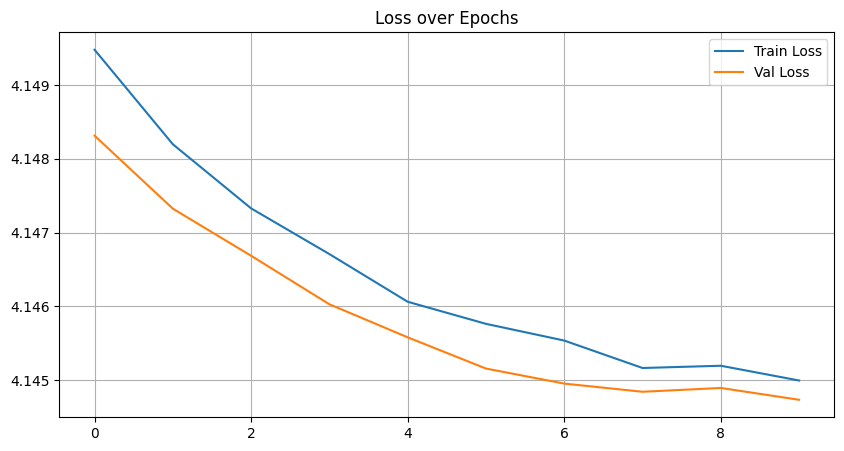

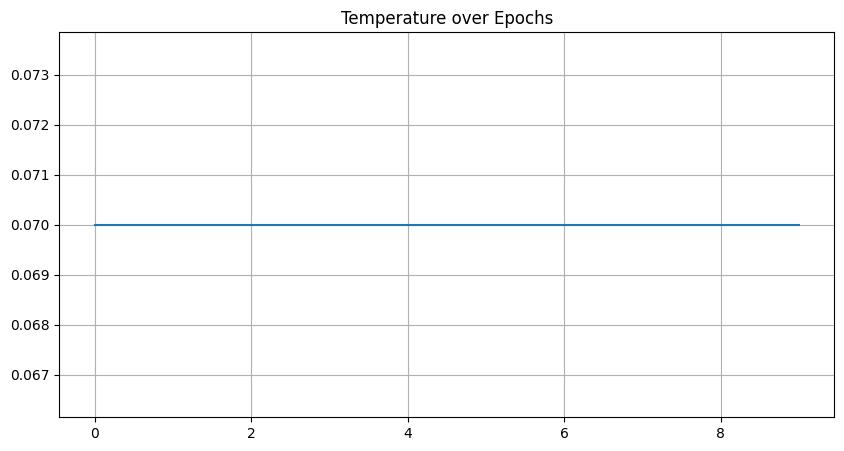

In [ ]:
import matplotlib.pyplot as plt

train_losses = [e['loss'] for e in history['train']]
val_losses = [e['loss'] for e in history['val']]
temps = [e['temperature'] for e in history['train']]

plt.figure(figsize=(10,5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.title('Loss over Epochs')
plt.legend()
plt.grid()
plt.savefig("clip_loss_curve.png")
plt.show()

plt.figure(figsize=(10,5))
plt.plot(temps, label='Temperature')
plt.title('Temperature over Epochs')
plt.grid()
plt.savefig("clip_temperature_curve.png")
plt.show()


In [ ]:
import torch
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from tqdm.auto import tqdm


def generate_embeddings(model, dataloader, device):
    model.eval()
    visual_embeddings = []
    text_embeddings = []

    with torch.no_grad():
        for images, texts in tqdm(dataloader, desc="Generating Embeddings"):
            # Move images to device
            images = images.to(device)

            # Sanitize and clean text input
            cleaned_texts = [str(t).strip() for t in texts if isinstance(t, str) and len(str(t).strip()) > 0]

            # Skip batch if text is not valid
            if len(cleaned_texts) == 0:
                continue

            try:
                # Tokenize texts
                text_inputs = model.tokenizer(cleaned_texts, return_tensors='pt', padding=True, truncation=True).to(device)

                # Get embeddings
                vis_emb, txt_emb, _ = model(images, cleaned_texts)

                visual_embeddings.append(vis_emb.cpu())
                text_embeddings.append(txt_emb.cpu())

            except Exception as e:
                print(" Skipping problematic batch:", cleaned_texts)
                print("Error:", str(e))
                continue

    # Concatenate all batches
    visual_embeddings = torch.cat(visual_embeddings, dim=0)
    text_embeddings = torch.cat(text_embeddings, dim=0)

    return visual_embeddings, text_embeddings


def compute_recall_at_k(vis_embs, txt_embs, ks=[1, 5, 10]):
    sim_matrix = cosine_similarity(txt_embs, vis_embs)
    recalls = {f"R@{k}": 0 for k in ks}
    for i, row in enumerate(sim_matrix):
        sorted_indices = np.argsort(row)[::-1]
        for k in ks:
            if i in sorted_indices[:k]:
                recalls[f"R@{k}"] += 1
    for k in ks:
        recalls[f"R@{k}"] = 100.0 * recalls[f"R@{k}"] / len(txt_embs)
    return recalls

In [ ]:
# Assuming model, val_loader, and device are ready
vis_embs, txt_embs = generate_embeddings(model, val_loader, device)

# Convert to NumPy
vis_embs_np = vis_embs.numpy()
txt_embs_np = txt_embs.numpy()

# Compute Recall@K
recall_metrics = compute_recall_at_k(vis_embs_np, txt_embs_np)
print(" Retrieval Evaluation:")
for k, val in recall_metrics.items():
    print(f"{k}: {val:.2f}%")


Generating Embeddings:   0%|          | 0/539 [00:00<?, ?it/s]

## **5. Comparative Analysis**

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
pip install torchinfo

In [ ]:
from torchinfo import summary

# BLIP Model Summary
summary(blip_model, depth=4)

Layer (type:depth-idx)                                            Param #
BlipForConditionalGeneration                                      --
├─BlipVisionModel: 1-1                                            --
│    └─BlipVisionEmbeddings: 2-1                                  591,872
│    │    └─Conv2d: 3-1                                           787,456
│    └─BlipEncoder: 2-2                                           --
│    │    └─ModuleList: 3-2                                       --
│    │    │    └─BlipEncoderLayer: 4-1                            12,596,224
│    │    │    └─BlipEncoderLayer: 4-2                            12,596,224
│    │    │    └─BlipEncoderLayer: 4-3                            12,596,224
│    │    │    └─BlipEncoderLayer: 4-4                            12,596,224
│    │    │    └─BlipEncoderLayer: 4-5                            12,596,224
│    │    │    └─BlipEncoderLayer: 4-6                            12,596,224
│    │    │    └─BlipEncoderLayer: 4-7  

In [ ]:
summary(vit_model, depth=4)

Layer (type:depth-idx)                                  Param #
VisionEncoderDecoderModel                               --
├─ViTModel: 1-1                                         --
│    └─ViTEmbeddings: 2-1                               152,064
│    │    └─ViTPatchEmbeddings: 3-1                     --
│    │    │    └─Conv2d: 4-1                            590,592
│    │    └─Dropout: 3-2                                --
│    └─ViTEncoder: 2-2                                  --
│    │    └─ModuleList: 3-3                             --
│    │    │    └─ViTLayer: 4-2                          7,087,872
│    │    │    └─ViTLayer: 4-3                          7,087,872
│    │    │    └─ViTLayer: 4-4                          7,087,872
│    │    │    └─ViTLayer: 4-5                          7,087,872
│    │    │    └─ViTLayer: 4-6                          7,087,872
│    │    │    └─ViTLayer: 4-7                          7,087,872
│    │    │    └─ViTLayer: 4-8                          7,

In [ ]:
def generate_caption_blip(image: Image.Image) -> str:
    inputs = blip_processor(images=image, return_tensors="pt").to(device)
    out = blip_model.generate(**inputs, max_length=50)
    caption = blip_processor.decode(out[0], skip_special_tokens=True)
    return caption

def generate_caption_vit(image: Image.Image) -> str:
    pixel_values = vit_processor(images=image, return_tensors="pt").pixel_values.to(device)
    generated_ids = vit_model.generate(pixel_values, max_length=50)
    caption = vit_tokenizer.decode(generated_ids[0], skip_special_tokens=True)
    return caption

In [ ]:
def evaluate_captions(references, predictions):
    bleu = load("bleu")
    meteor = load("meteor")
    rouge = load("rouge")

    results = {}

    bleu.add_batch(predictions=predictions, references=[[ref] for ref in references])
    meteor.add_batch(predictions=predictions, references=references)
    rouge.add_batch(predictions=predictions, references=references)

    results['BLEU'] = bleu.compute()["bleu"]
    results['METEOR'] = meteor.compute()["meteor"]
    results['ROUGE-L'] = rouge.compute()["rougeL"]

    return results

In [ ]:
def plot_similarity_matrix(captions_blip, captions_vit, title):
    from sklearn.feature_extraction.text import TfidfVectorizer
    from sklearn.metrics.pairwise import cosine_similarity

    all_captions = captions_blip + captions_vit
    vectorizer = TfidfVectorizer()
    tfidf = vectorizer.fit_transform(all_captions)

    sim_matrix = cosine_similarity(tfidf)

    plt.figure(figsize=(12, 10))
    sns.heatmap(sim_matrix, cmap="viridis", xticklabels=False, yticklabels=False)
    plt.title(title, fontsize=16)
    plt.show()

In [ ]:
image_folder = "/content/sample_data"
image_filenames = [os.path.join(image_folder, img) for img in os.listdir(image_folder) if img.endswith(('jpg', 'png'))]

In [ ]:
blip_captions = []
vit_captions = []

print("Generating captions...")

for image_path in image_filenames:
    image = Image.open(image_path).convert('RGB')

    blip_caption = generate_caption_blip(image)
    vit_caption = generate_caption_vit(image)

    blip_captions.append(blip_caption)
    vit_captions.append(vit_caption)

    print(f"Image: {image_path}")
    print(f"\tBLIP Caption   : {blip_caption}")
    print(f"\tViT-GPT2 Caption: {vit_caption}\n")

Generating captions...
Image: /content/sample_data/COCO_val2014_000000579664.jpg
	BLIP Caption   : there are many bananas in a wooden box on the table
	ViT-GPT2 Caption: a wooden table topped with lots of bananas 

Image: /content/sample_data/CONCEPTUAL_01.jpg
	BLIP Caption   : a 3d man holding a globe in his hands
	ViT-GPT2 Caption: a toy of a cat with a cartoon character on it 

Image: /content/sample_data/COCO_val2014_000000562207.jpg
	BLIP Caption   : there are three people standing next to an elephant in the water
	ViT-GPT2 Caption: a man and woman standing next to an elephant 

Image: /content/sample_data/COCO_val2014_000000060623.jpg
	BLIP Caption   : woman blowing out candles on a cake with a bowl of ice cream
	ViT-GPT2 Caption: a girl sitting at a table with a lit candle 

Image: /content/sample_data/COCO_val2014_000000386164.jpg
	BLIP Caption   : a close up of a table with wooden spoons and spoons on it
	ViT-GPT2 Caption: a wooden table topped with wooden bowls and wooden sti

In [ ]:
references = ["A person riding a horse", "A cat sitting on a couch", "A group of people playing football"] * (len(image_filenames) // 3 + 1)
references = references[:len(image_filenames)]

In [ ]:
!pip install rouge_score
!pip install nltk

In [ ]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
blip_metrics = evaluate_captions(references, blip_captions)
vit_metrics = evaluate_captions(references, vit_captions)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
metric_names = list(blip_metrics.keys())
blip_scores = [blip_metrics[m] for m in metric_names]
vit_scores = [vit_metrics[m] for m in metric_names]

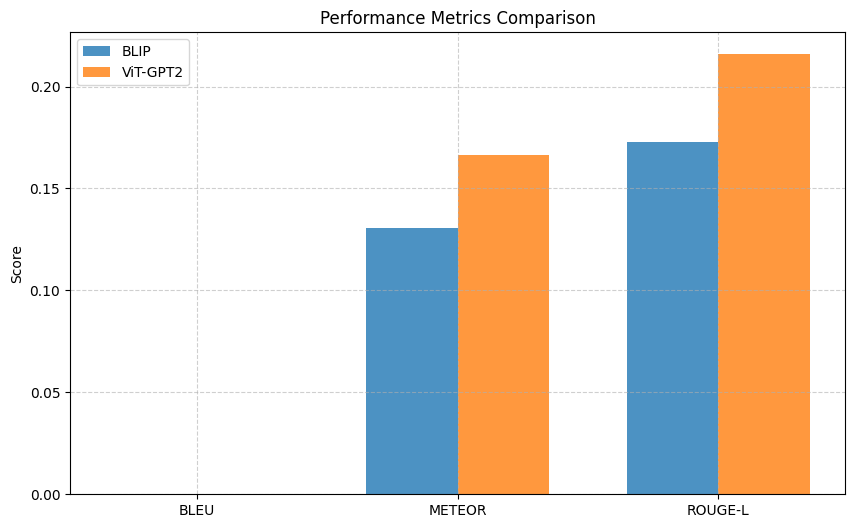

In [ ]:
x = np.arange(len(metric_names))
width = 0.35

plt.figure(figsize=(10, 6))
plt.bar(x - width/2, blip_scores, width, label='BLIP', alpha=0.8)
plt.bar(x + width/2, vit_scores, width, label='ViT-GPT2', alpha=0.8)
plt.xticks(x, metric_names)
plt.ylabel('Score')
plt.title('Performance Metrics Comparison')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

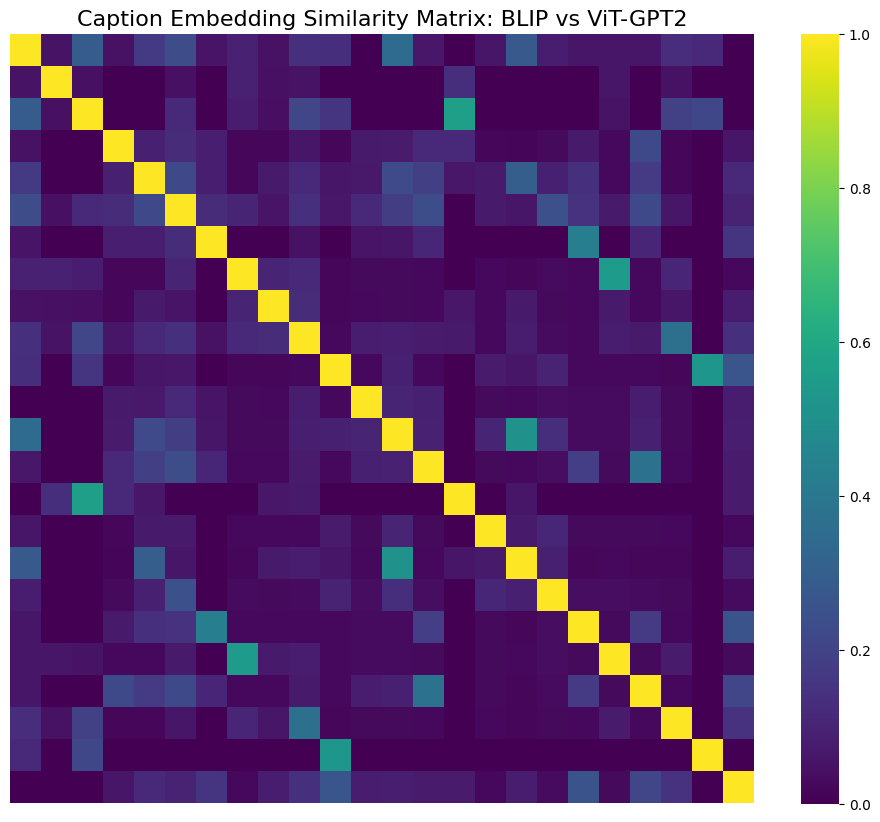

In [ ]:
plot_similarity_matrix(blip_captions, vit_captions, title="Caption Embedding Similarity Matrix: BLIP vs ViT-GPT2")

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

def plot_similarity_histogram(captions_blip, captions_vit, title):
    all_captions = captions_blip + captions_vit
    labels = ['BLIP'] * len(captions_blip) + ['ViT'] * len(captions_vit)

    vectorizer = TfidfVectorizer()
    tfidf = vectorizer.fit_transform(all_captions)

    sim_matrix = cosine_similarity(tfidf)

    # Extract cross similarities (BLIP vs ViT only)
    n = len(captions_blip)
    cross_similarities = []

    for i in range(n):
        for j in range(n, len(all_captions)):
            cross_similarities.append(sim_matrix[i, j])

    # Plot
    plt.figure(figsize=(10,6))
    plt.hist(cross_similarities, bins=20, color='skyblue', edgecolor='black')
    plt.title(title, fontsize=16)
    plt.xlabel('Cosine Similarity')
    plt.ylabel('Frequency')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

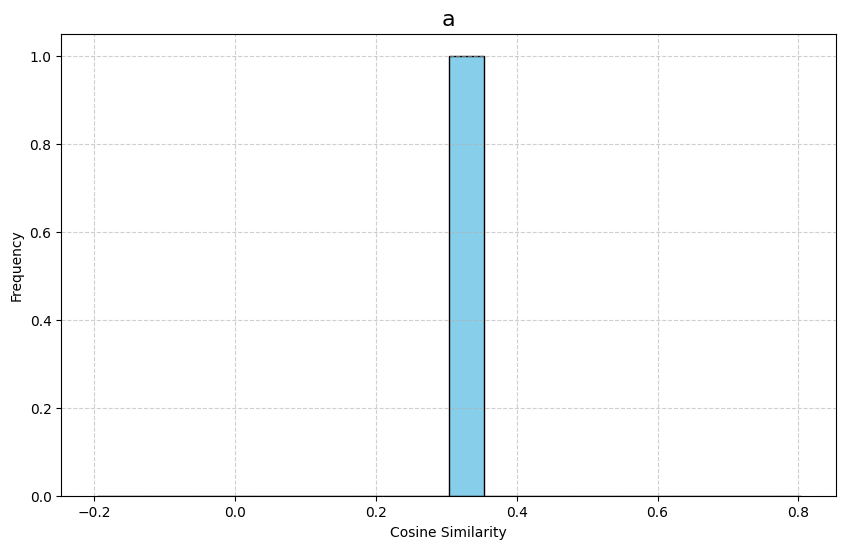

In [ ]:
plot_similarity_histogram(blip_captions, vit_captions, title='a')

## **6. Attention Visualization for BLIP Model**

In [ ]:
import cv2
import torchvision.transforms as T

def visualize_blip_attention(image_path, model, processor, device, save_path=None):
    model.eval()

    # Load and preprocess image
    raw_image = Image.open(image_path).convert('RGB')
    inputs = processor(raw_image, return_tensors="pt").to(device)

    # Forward pass through vision encoder only
    with torch.no_grad():
        encoder_outputs = model.vision_model(
            pixel_values=inputs.pixel_values,
            output_attentions=True,
            return_dict=True
        )
        attention_maps = encoder_outputs.attentions

    # Take last layer attentions
    attention = attention_maps[-1]

    # Average across heads
    avg_attention = attention.mean(dim=1)[0]

    cls_attention = avg_attention[0, 1:]

    num_patches = cls_attention.shape[0]
    size = int(num_patches ** 0.5)

    # Reshape and normalize
    attention_map = cls_attention.reshape(size, size).cpu().numpy()
    attention_map = cv2.resize(attention_map, raw_image.size)

    attention_map = (attention_map - attention_map.min()) / (attention_map.max() - attention_map.min())

    # Overlay attention map on the original image
    cmap = plt.get_cmap('jet')
    attention_overlay = cmap(attention_map)[:, :, :3]
    attention_overlay = (attention_overlay * 255).astype(np.uint8)

    blended = cv2.addWeighted(np.array(raw_image), 0.6, attention_overlay, 0.4, 0)

    # Plot
    plt.figure(figsize=(10,5))
    plt.imshow(blended)
    plt.axis('off')
    plt.title('BLIP Attention Map')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()


Generating Attention Maps for 12 images...

  Image 1: /content/sample_data/COCO_val2014_000000579664.jpg


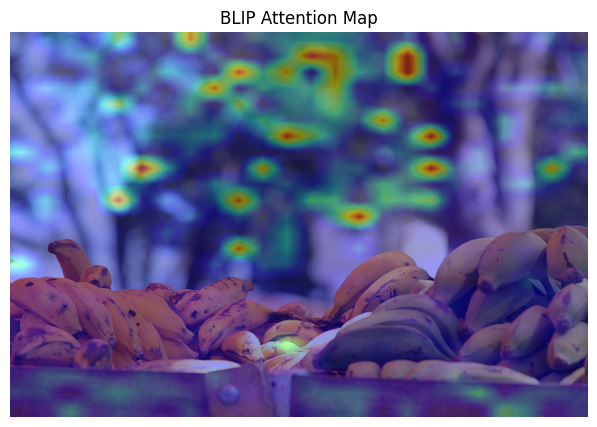

  Image 2: /content/sample_data/CONCEPTUAL_01.jpg


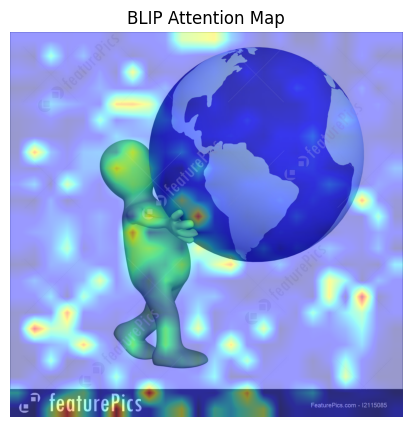

  Image 3: /content/sample_data/COCO_val2014_000000562207.jpg


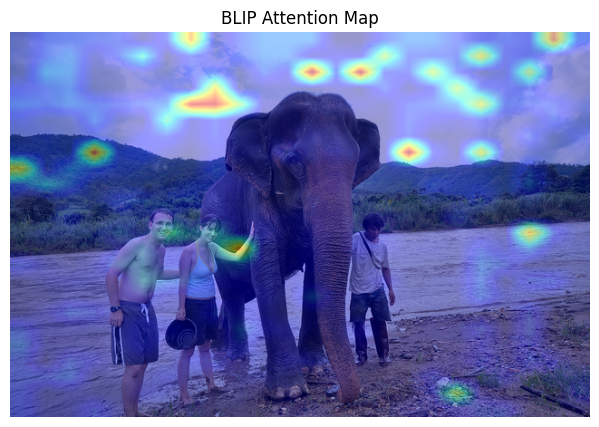

  Image 4: /content/sample_data/COCO_val2014_000000060623.jpg


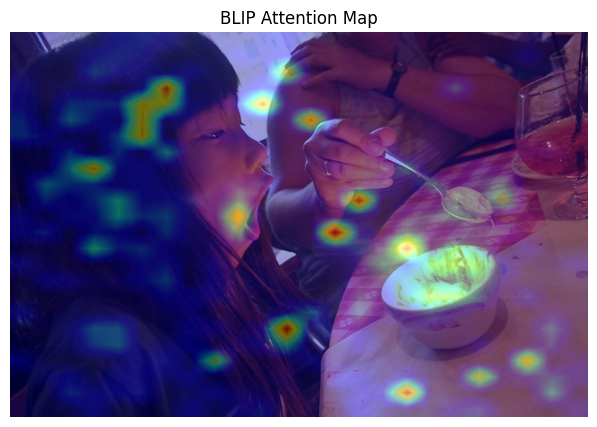

  Image 5: /content/sample_data/COCO_val2014_000000386164.jpg


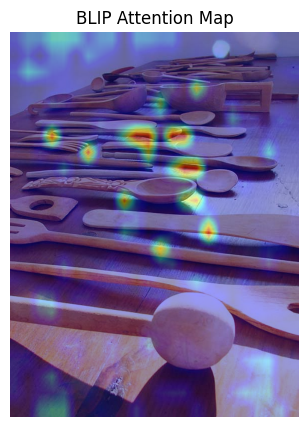

  Image 6: /content/sample_data/COCO_val2014_000000165547.jpg


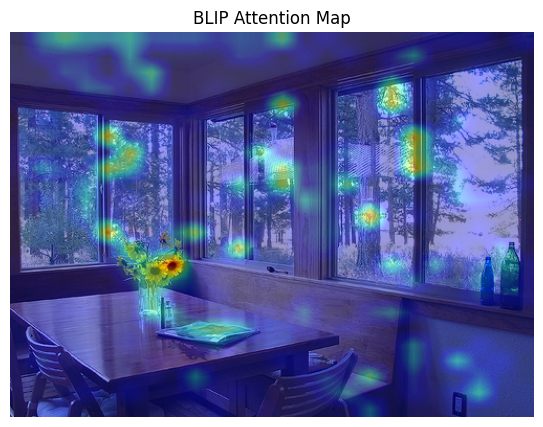

  Image 7: /content/sample_data/CONCEPTUAL_03.jpg


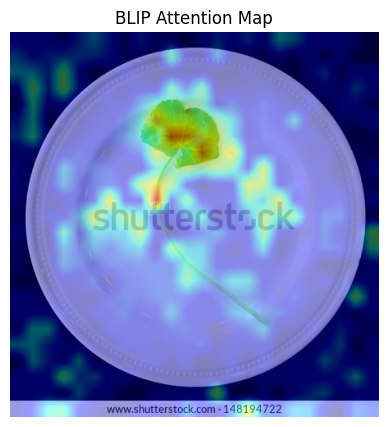

  Image 8: /content/sample_data/COCO_val2014_000000354533.jpg


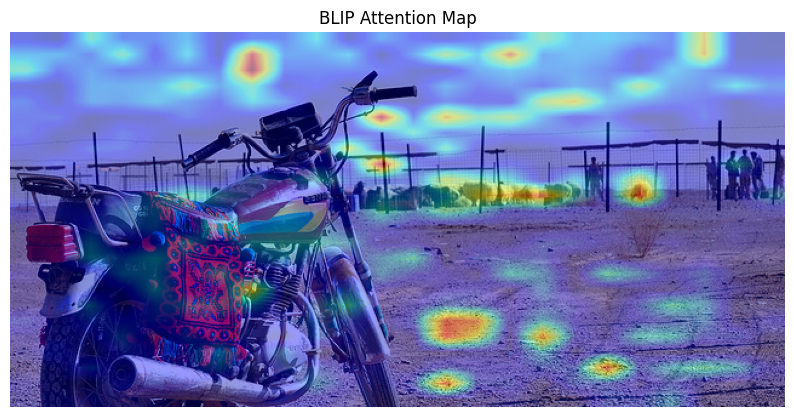

  Image 9: /content/sample_data/CONCEPTUAL_06.jpg


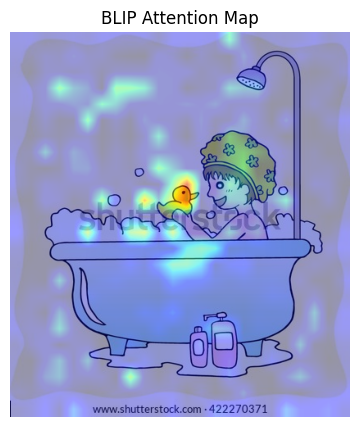

  Image 10: /content/sample_data/CONCEPTUAL_04.jpg


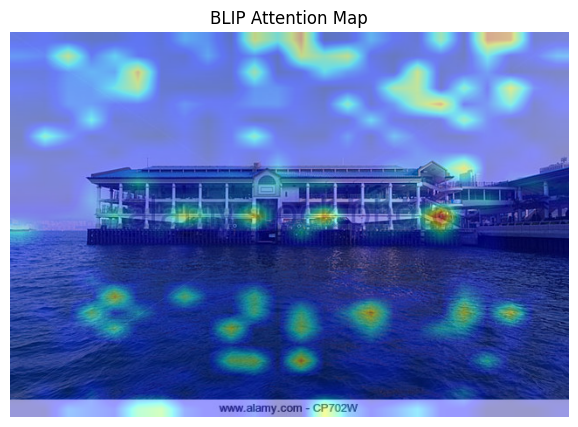

  Image 11: /content/sample_data/CONCEPTUAL_02.jpg


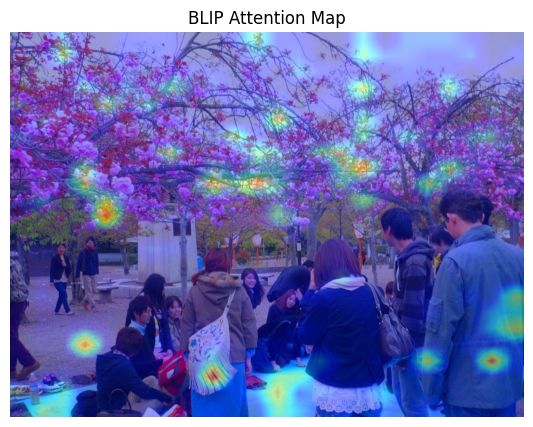

  Image 12: /content/sample_data/CONCEPTUAL_05.jpg


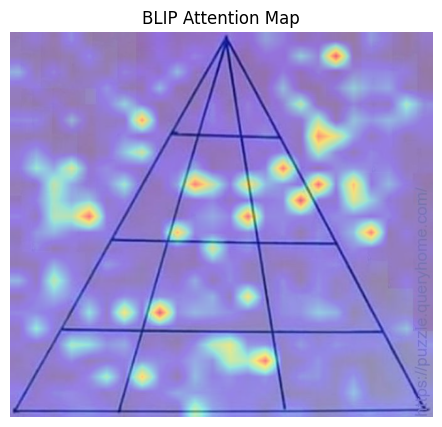

In [ ]:
def plot_attention_maps_for_all_images(image_paths, model, processor, device):
    print(f"Generating Attention Maps for {len(image_paths)} images...\n")

    for idx, img_path in enumerate(image_paths):
        print(f"  Image {idx+1}: {img_path}")
        visualize_blip_attention(img_path, model, processor, device)
        print("="*80)

plot_attention_maps_for_all_images(image_filenames, blip_model, blip_processor, device)

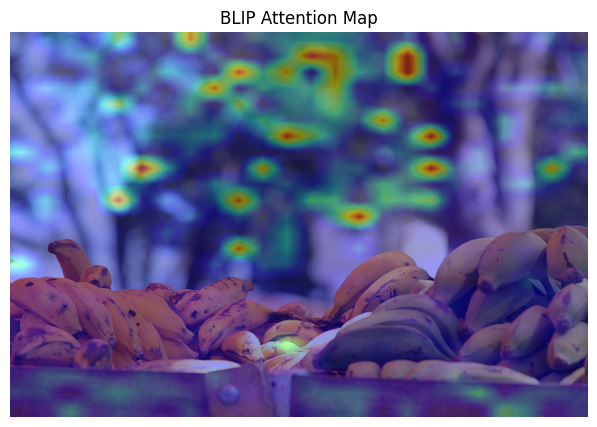

In [ ]:
sample_image_path = image_filenames[0]  # Pick any test image
visualize_blip_attention(sample_image_path, blip_model, blip_processor, device)


In [ ]:
def print_image_with_captions(image_paths, blip_captions, vit_captions):
    assert len(image_paths) == len(blip_captions) == len(vit_captions), "Mismatch in lengths!"

    for idx in range(len(image_paths)):
        img = Image.open(image_paths[idx]).convert('RGB')

        plt.figure(figsize=(8,6))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Image {idx+1}", fontsize=16)
        plt.show()

        print(f"1. BLIP Caption   : {blip_captions[idx]}")
        print(f"2. ViT Caption: {vit_captions[idx]}")
        print(f"=========================================")
        print("="*80)

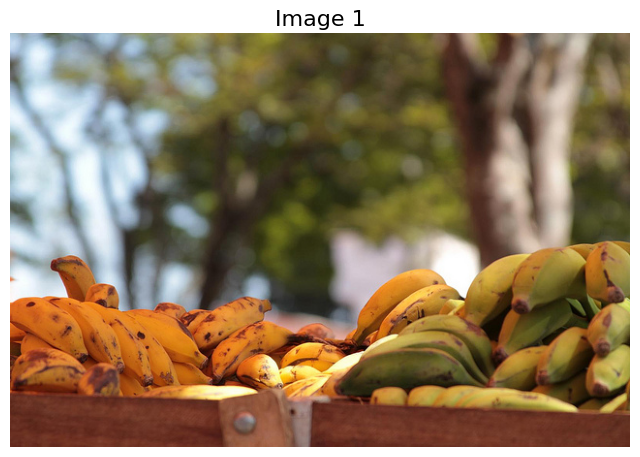

1. BLIP Caption   : there are many bananas in a wooden box on the table
2. ViT Caption: a wooden table topped with lots of bananas 


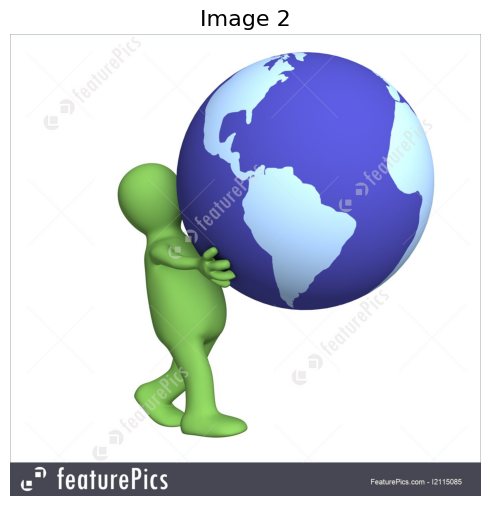

1. BLIP Caption   : a 3d man holding a globe in his hands
2. ViT Caption: a toy of a cat with a cartoon character on it 


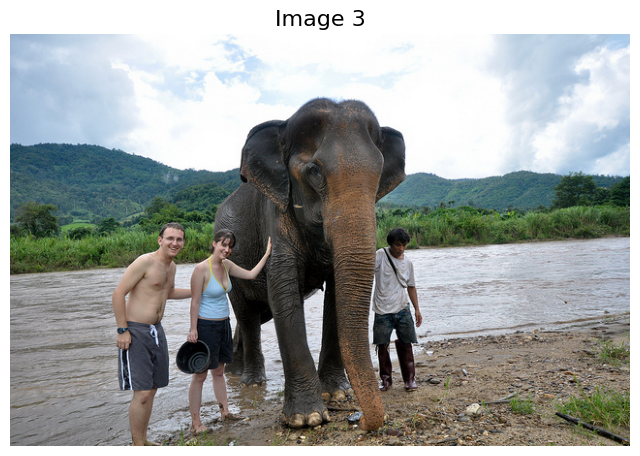

1. BLIP Caption   : there are three people standing next to an elephant in the water
2. ViT Caption: a man and woman standing next to an elephant 


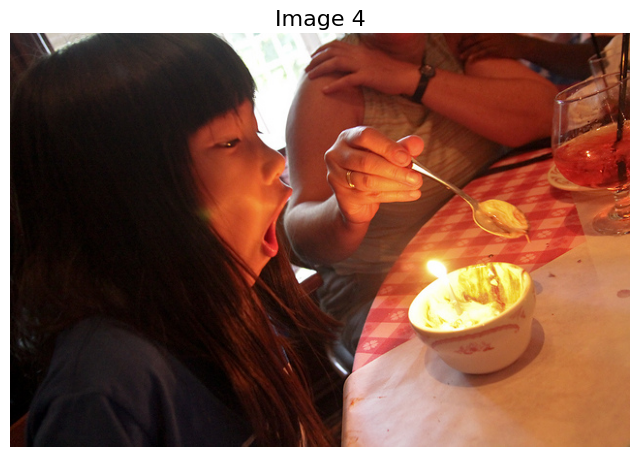

1. BLIP Caption   : woman blowing out candles on a cake with a bowl of ice cream
2. ViT Caption: a girl sitting at a table with a lit candle 


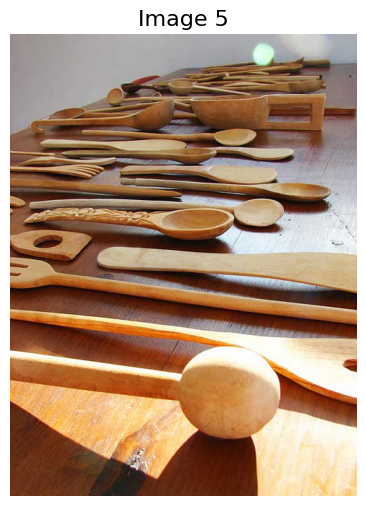

1. BLIP Caption   : a close up of a table with wooden spoons and spoons on it
2. ViT Caption: a wooden table topped with wooden bowls and wooden sticks 


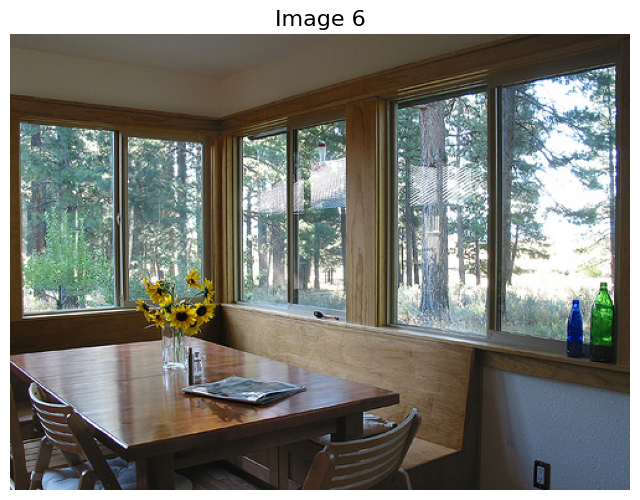

1. BLIP Caption   : there is a table with a vase of flowers on it in front of a window
2. ViT Caption: a dining room table with a window 


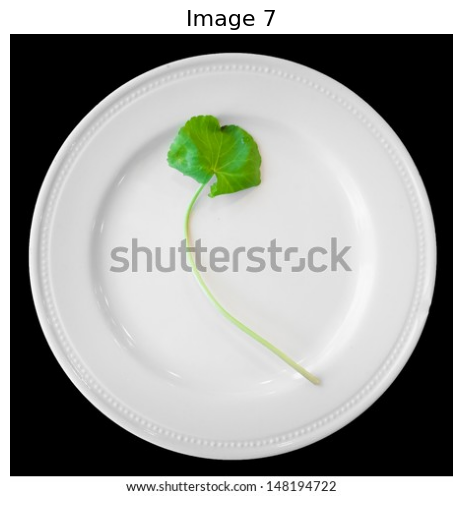

1. BLIP Caption   : a single leaf of a green plant on a white plate
2. ViT Caption: a white plate with a white bird on it 


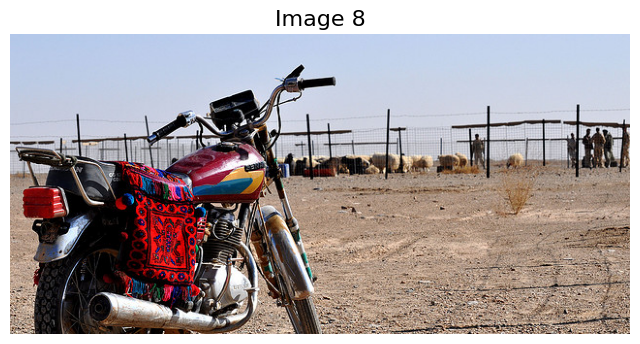

1. BLIP Caption   : motorcycle parked in dirt area with sheep in background
2. ViT Caption: a motorcycle parked in a dirt field with a fence 


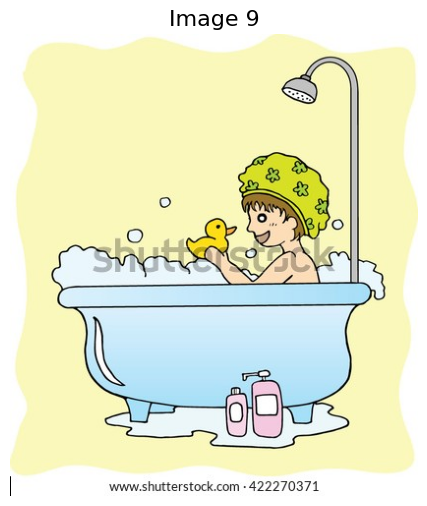

1. BLIP Caption   : a boy taking a bath in a bathtub with soap and a rubber duck
2. ViT Caption: a painting of a child's birthday cake with a cat on it 


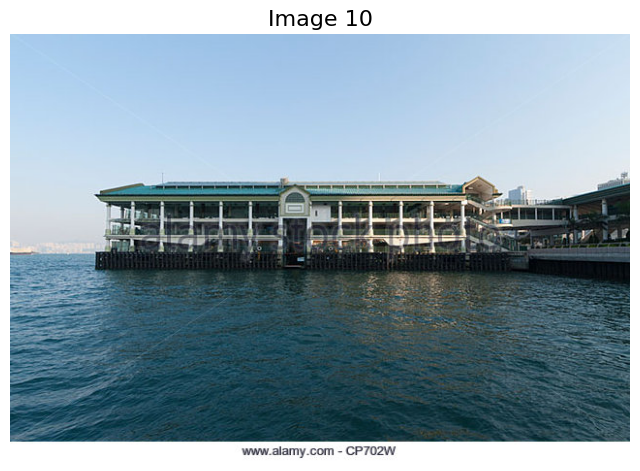

1. BLIP Caption   : a view of a pier with a restaurant and a boat in the water
2. ViT Caption: a large building with a large boat in the water 


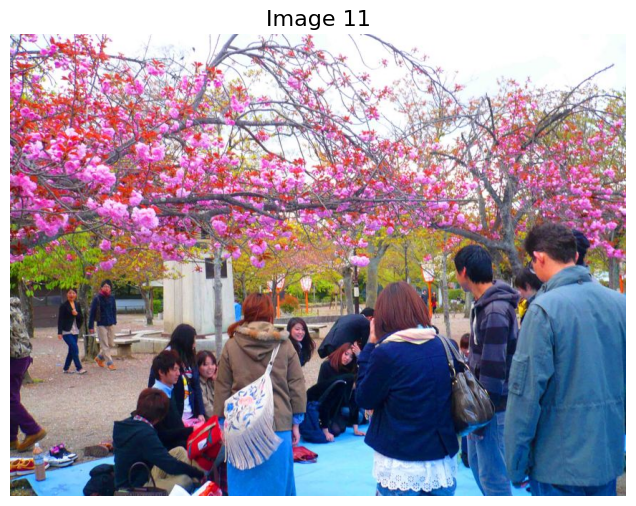

1. BLIP Caption   : people are gathered around a blue table with a blue cloth
2. ViT Caption: people are gathered around a tree 


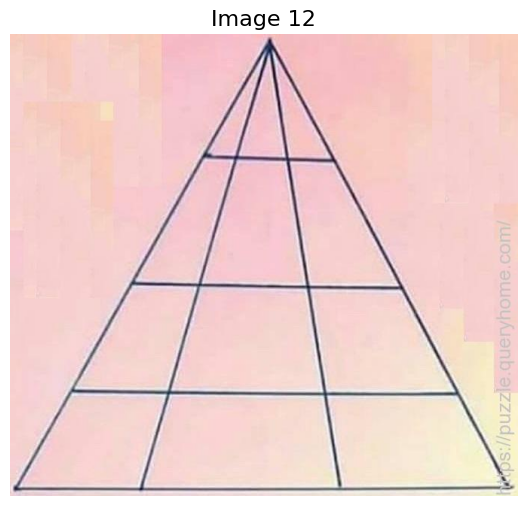

1. BLIP Caption   : arafed triangle with a line drawing of a triangle with a line drawing of a triangle with a line drawing of a triangle
2. ViT Caption: a painting of a building with a blue and white striped wall 


In [ ]:
print_image_with_captions(image_filenames, blip_captions, vit_captions)

**References**

[1] Plummer, B. A., Wang, L., Cervantes, C. M., Caicedo, J. C., & Hockenmaier, J. (2017).
    Flickr30k Entities: Collecting Region-to-Phrase Correspondences for Richer Image-to-Sentence Models.
    *International Journal of Computer Vision (IJCV)*, 123(1), 74–93.

[2] Young, P., Lai, A., Hodosh, M., & Hockenmaier, J. (2014).
    From image descriptions to visual denotations: New similarity metrics for semantic inference over event descriptions.
    *Transactions of the Association for Computational Linguistics (TACL)*, 2, 67–78.

[3] Chen, T., Kornblith, S., Norouzi, M., & Hinton, G. (2020).
    A Simple Framework for Contrastive Learning of Visual Representations.
    In *Proceedings of the 37th International Conference on Machine Learning (ICML)*. arXiv:2002.05709

[4] He, K., Zhang, X., Ren, S., & Sun, J. (2016).
    Deep Residual Learning for Image Recognition.
    In *Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition (CVPR)*, 770–778.

[5] Paszke, A., Gross, S., Massa, F., Lerer, A., Bradbury, J., Chanan, G., ... & Chintala, S. (2019).
    PyTorch: An Imperative Style, High-Performance Deep Learning Library.
    In *Advances in Neural Information Processing Systems (NeurIPS)*, 32.

[6] Wolf, T., Debut, L., Sanh, V., Chaumond, J., Delangue, C., Moi, A., ... & Rush, A. M. (2020).
    Transformers: State-of-the-art Natural Language Processing.
    In *Proceedings of the 2020 Conference on Empirical Methods in Natural Language Processing: System Demonstrations*, 38–45.

[7] van der Maaten, L., & Hinton, G. (2008).
    Visualizing data using t-SNE.
    *Journal of Machine Learning Research*, 9(Nov), 2579–2605.

[8] Pedregosa, F., Varoquaux, G., Gramfort, A., Michel, V., Thirion, B., Grisel, O., ... & Duchesnay, É. (2011).
    Scikit-learn: Machine Learning in Python.
    *Journal of Machine Learning Research*, 12, 2825–2830.

[9] Matplotlib Development Team. (2023).
    Matplotlib: Visualization with Python. https://matplotlib.org/

[10] Virtanen, P., Gommers, R., Oliphant, T. E., Haberland, M., Reddy, T., Cournapeau, D., ... & van der Walt, S. J. (2020).
     SciPy 1.0: Fundamental Algorithms for Scientific Computing in Python.
     *Nature Methods*, 17(3), 261–272.

[11] Hunter, J. D. (2007).
     Matplotlib: A 2D Graphics Environment.
     *Computing in Science & Engineering*, 9(3), 90–95.

[12] Abadi, M., Agarwal, A., Barham, P., Brevdo, E., Chen, Z., Citro, C., ... & Zheng, X. (2016).
     TensorFlow: Large-scale machine learning on heterogeneous systems. https://tensorflow.org

[13] Oord, A. v. d., Li, Y., & Vinyals, O. (2018).
     Representation Learning with Contrastive Predictive Coding.

[14] Wang, X., Hua, Y., Kodirov, E., & Gong, S.
     Self-supervised Learning with Randomized Relations for Visual Representation.

[15] Tsimpoukelli, M., Menick, J., Cabi, S., Eslami, S. M. A., Vinyals, O., & Hill, F. (2021).
     Multimodal Few-Shot Learning with Frozen Language Models.
     In *Advances in Neural Information Processing Systems (NeurIPS)*.

[16] Cornia, M., Stefanini, M., Baraldi, L., & Cucchiara, R. (2020).
     Meshed-Memory Transformer for Image Captioning.
     In *Proceedings of the IEEE/CVF Conference on Computer Vision and Pattern Recognition (CVPR)*, 10578–10587.

[17] Zhang, X., Zhang, Y., Dai, X., Wang, J., Yuan, L., & Gao, J. (2022).
     VLP: Large-scale Vision-Language Pre-training for Image Captioning.
     In *Proceedings of the IEEE/CVF Conference on Computer Vision and Pattern Recognition (CVPR)*.

[18] Li, J., Li, K., Xiong, C., & Hoi, S. C. H. (2023).
     BLIP-2: Bootstrapping Language-Image Pre-training with Frozen Image Encoders and Large Language Models.
     In *International Conference on Learning Representations (ICLR)*.
